In [1]:
from fastai.vision.all import *
import cv2
import gc

In [2]:
path = Path('train')

In [3]:
fnames = get_image_files(path)

In [4]:
fnames

(#38496) [Path('train/case116/case116_day0/scans/slice_0140_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0080_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0108_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0121_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0136_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0124_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0019_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0089_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0086_360_310_1.50_1.50.png'),Path('train/case116/case116_day0/scans/slice_0099_360_310_1.50_1.50.png')...]

I don't understand what I'm supposed to do with these images?

Is the task to classify one image, or the series of images?

Let's take a look into the train and submission csv

In [10]:
train = pd.read_csv('train.csv')
submission = pd.read_csv('sample_submission.csv')

In [11]:
train.head()

,id,class,segmentation
0,case123_day20_slice_0001,large_bowel,NaN
1,case123_day20_slice_0001,small_bowel,NaN
2,case123_day20_slice_0001,stomach,NaN
3,case123_day20_slice_0002,large_bowel,NaN
4,case123_day20_slice_0002,small_bowel,NaN


In [12]:
submission

,id,class,predicted


In [20]:
def check_file(file_id, fname):
    case_id, day, _, slice_no = file_id.split('_')
    if case_id == fname.parts[1] and day == fname.parts[2].split('_')[1] and slice_no in fname.parts[-1]:
        return True
    return False

def get_file(file_id):
    return fnames.filter(lambda f: check_file(not_null_train.id[0], f))[0]

It seems that this case's images aren't good.

Let's make a function to view images of a case.

In [15]:
def view_case_images(case_no, day_no):
    case_fnames = get_image_files(Path(f'train/case{case_no}/case{case_no}_day{day_no}/'))
    case_fnames.sort()
    
    fig, axes = plt.subplots(24, 6, figsize=(6*3, 24*3))
    axes = axes.flatten()

    for i, fn in enumerate(case_fnames):
        img = Image.open(fn)
        img = np.array(img) / np.max(img)
        img = np.interp(img, [np.min(img), np.max(img)], [0,255])
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(case_fnames[i].parts[-1].split('_')[1])
        axes[i].set_xticks([])
        axes[i].set_yticks([])

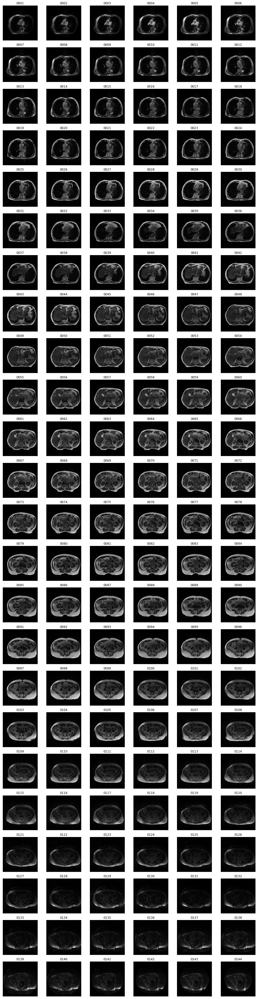

In [16]:
view_case_images(140, 10)

In [18]:
# https://www.kaggle.com/code/dschettler8845/uwm-gi-tract-image-segmentation-eda
def get_custom_df(train_df):
    
    train_df = train_df.copy()
    
    TRAIN_DIR = 'train'
    print("\n... UPDATING DATAFRAMES WITH ACCESSIBLE INFORMATION STARTED ...\n\n")

    # 1. Get Case-ID as a column (str and int)
    train_df["case_id_str"] = train_df["id"].apply(lambda x: x.split("_", 2)[0])
    train_df["case_id"] = train_df["id"].apply(lambda x: int(x.split("_", 2)[0].replace("case", "")))

    # 2. Get Day as a column
    train_df["day_num_str"] = train_df["id"].apply(lambda x: x.split("_", 2)[1])
    train_df["day_num"] = train_df["id"].apply(lambda x: int(x.split("_", 2)[1].replace("day", "")))

    # 3. Get Slice Identifier as a column
    train_df["slice_id"] = train_df["id"].apply(lambda x: x.split("_", 2)[2])

    # 4. Get full file paths for the representative scans
    train_df["_partial_fname"] = ("train/"+ # /kaggle/input/uw-madison-gi-tract-image-segmentation/train/
                          train_df["case_id_str"]+"/"+ # .../case###/
                          train_df["case_id_str"]+"_"+train_df["day_num_str"]+ # .../case###_day##/
                          "/scans/"+train_df["slice_id"]) # .../slice_####

    _tmp_merge_df = pd.DataFrame({"_partial_fname":[str(x).rsplit("_",4)[0] for x in fnames], "fname": fnames})
    train_df = train_df.merge(_tmp_merge_df, on="_partial_fname").drop(columns=["_partial_fname"])
    
    # Minor cleanup of our temporary workaround
    del _tmp_merge_df; gc.collect(); gc.collect()

    # 5. Get slice dimensions from filepath (int in pixels)
    train_df["slice_h"] = train_df["fname"].apply(lambda x: int(str(x)[:-4].rsplit("_",4)[1]))
    train_df["slice_w"] = train_df["fname"].apply(lambda x: int(str(x)[:-4].rsplit("_",4)[2]))

    # 6. Pixel spacing from filepath (float in mm)
    train_df["px_spacing_h"] = train_df["fname"].apply(lambda x: float(str(x)[:-4].rsplit("_",4)[3]))
    train_df["px_spacing_w"] = train_df["fname"].apply(lambda x: float(str(x)[:-4].rsplit("_",4)[4]))

    # 7. Merge 3 Rows Into A Single Row (As This/Segmentation-RLE Is The Only Unique Information Across Those Rows)
    l_bowel_train_df = train_df[train_df["class"]=="large_bowel"][["id", "segmentation"]].rename(columns={"segmentation":"lb_seg_rle"})
    s_bowel_train_df = train_df[train_df["class"]=="small_bowel"][["id", "segmentation"]].rename(columns={"segmentation":"sb_seg_rle"})
    stomach_train_df = train_df[train_df["class"]=="stomach"][["id", "segmentation"]].rename(columns={"segmentation":"st_seg_rle"})
    train_df = train_df.merge(l_bowel_train_df, on="id", how="left")
    train_df = train_df.merge(s_bowel_train_df, on="id", how="left")
    train_df = train_df.merge(stomach_train_df, on="id", how="left")
    train_df = train_df.drop_duplicates(subset=["id",]).reset_index(drop=True)
    train_df["lb_seg_flag"] = train_df["lb_seg_rle"].apply(lambda x: not pd.isna(x))
    train_df["sb_seg_flag"] = train_df["sb_seg_rle"].apply(lambda x: not pd.isna(x))
    train_df["st_seg_flag"] = train_df["st_seg_rle"].apply(lambda x: not pd.isna(x))
    train_df["n_segs"] = train_df["lb_seg_flag"].astype(int)+train_df["sb_seg_flag"].astype(int)+train_df["st_seg_flag"].astype(int)

    # 8. Reorder columns to the a new ordering (drops class and segmentation as no longer necessary)
    train_df = train_df[["id", "fname", "n_segs",
                         "lb_seg_rle", "lb_seg_flag",
                         "sb_seg_rle", "sb_seg_flag", 
                         "st_seg_rle", "st_seg_flag",
                         "slice_h", "slice_w", "px_spacing_h", 
                         "px_spacing_w", "case_id_str", "case_id", 
                         "day_num_str", "day_num", "slice_id",]]

    # 9. Display update dataframe
    print("\n... UPDATED TRAINING DATAFRAME... \n")

    return train_df

In [19]:
train = get_custom_df(train)


... UPDATING DATAFRAMES WITH ACCESSIBLE INFORMATION STARTED ...



... UPDATED TRAINING DATAFRAME... 



In [20]:
train.head()

,id,fname,n_segs,lb_seg_rle,lb_seg_flag,sb_seg_rle,sb_seg_flag,st_seg_rle,st_seg_flag,slice_h,slice_w,px_spacing_h,px_spacing_w,case_id_str,case_id,day_num_str,day_num,slice_id
0,case123_day20_slice_0001,train/case123/case123_day20/scans/slice_0001_266_266_1.50_1.50.png,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0001
1,case123_day20_slice_0002,train/case123/case123_day20/scans/slice_0002_266_266_1.50_1.50.png,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0002
2,case123_day20_slice_0003,train/case123/case123_day20/scans/slice_0003_266_266_1.50_1.50.png,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0003
3,case123_day20_slice_0004,train/case123/case123_day20/scans/slice_0004_266_266_1.50_1.50.png,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0004
4,case123_day20_slice_0005,train/case123/case123_day20/scans/slice_0005_266_266_1.50_1.50.png,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0005


Now I'll add a function to convert RLE masks to normal segmentation masks

In [21]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
# modified from: https://www.kaggle.com/inversion/run-length-decoding-quick-start
def rle_decode(mask_rle, shape, color=1):
    """ TBD
    
    Args:
        mask_rle (str): run-length as string formated (start length)
        shape (tuple of ints): (height,width) of array to return 
    
    Returns: 
        Mask (np.array)
            - 1 indicating mask
            - 0 indicating background

    """
    # Split the string by space, then convert it into a integer array
    s = np.array(mask_rle.split(), dtype=int)

    # Every even value is the start, every odd value is the "run" length
    starts = s[0::2] - 1
    lengths = s[1::2]
    ends = starts + lengths

    # The image image is actually flattened since RLE is a 1D "run"
    if len(shape)==3:
        h, w, d = shape
        img = np.zeros((h * w, d), dtype=np.float32)
    else:
        h, w = shape
        img = np.zeros((h * w,), dtype=np.float32)

    # The color here is actually just any integer you want!
    for lo, hi in zip(starts, ends):
        img[lo : hi] = color
        
    # Don't forget to change the image back to the original shape
    return img.reshape(shape)

In [54]:
def view_case_images_with_masks(case_no, day_no, nrow=24, ncol=6):
    case_fnames = get_image_files(Path(f'train/case{case_no}/case{case_no}_day{day_no}/'))
    case_fnames.sort()
    
    fig, axes = plt.subplots(nrow, ncol, figsize=(ncol*3, nrow*3))
    axes = axes.flatten()

    for i, fn in enumerate(case_fnames):
        img = Image.open(fn)
        img = np.array(img) / np.max(img)
        img = np.interp(img, [np.min(img), np.max(img)], [0,255])
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(case_fnames[i].parts[-1].split('_')[1])
        axes[i].set_xticks([])
        axes[i].set_yticks([])
        
        tmp = train.query('fname == @fn').iloc[0]
        for j, seg in enumerate(['lb_seg', 'sb_seg', 'st_seg']):
            mask = np.zeros((tmp['slice_h'], tmp['slice_w']))
            if tmp[seg+'_flag']:   
                mask += rle_decode(tmp[seg+'_rle'], shape=(tmp['slice_h'], tmp['slice_w']), color=j)
        mask = PILMask.create(mask)
        mask.show(ctx=axes[i])

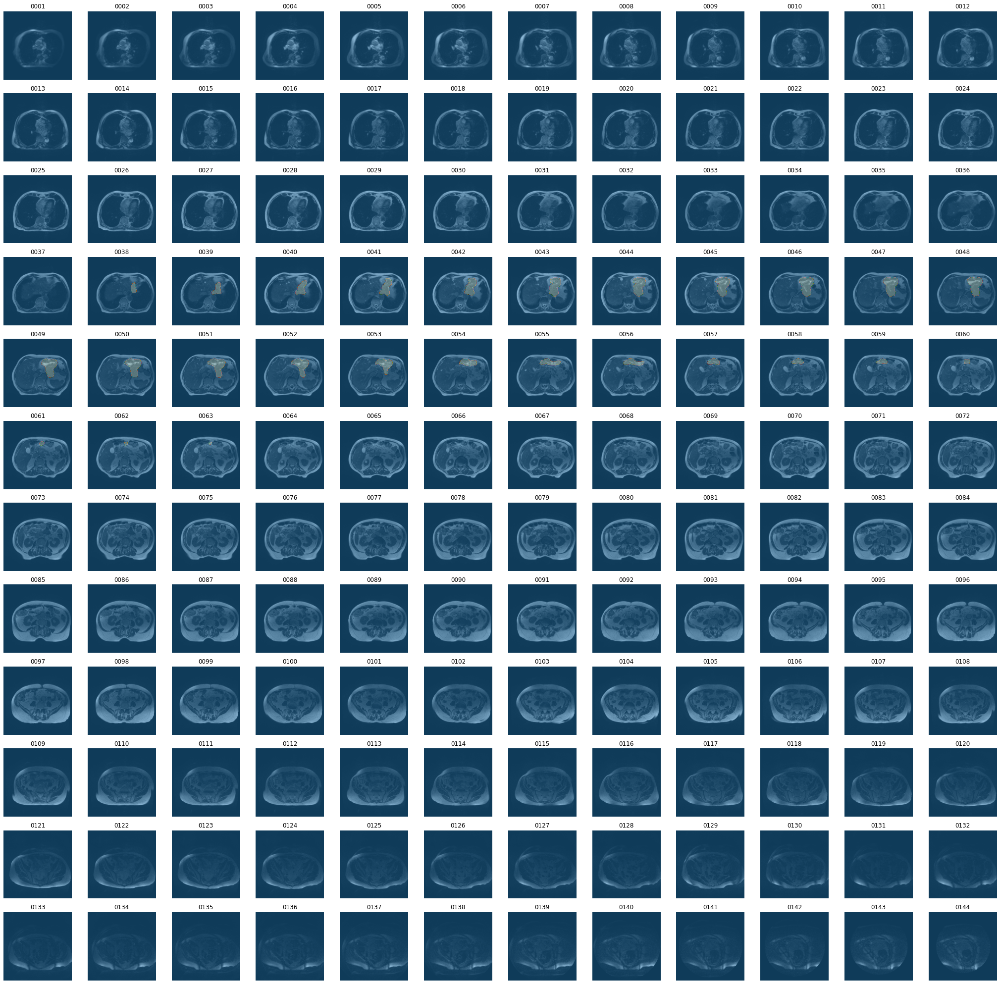

In [55]:
view_case_images_with_masks(140, 10, 12, 12)

In [56]:
train.sample(1)

,id,fname,n_segs,lb_seg_rle,lb_seg_flag,sb_seg_rle,sb_seg_flag,st_seg_rle,st_seg_flag,slice_h,slice_w,px_spacing_h,px_spacing_w,case_id_str,case_id,day_num_str,day_num,slice_id
2580,case139_day14_slice_0133,train/case139/case139_day14/scans/slice_0133_266_266_1.50_1.50.png,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case139,139,day14,14,slice_0133


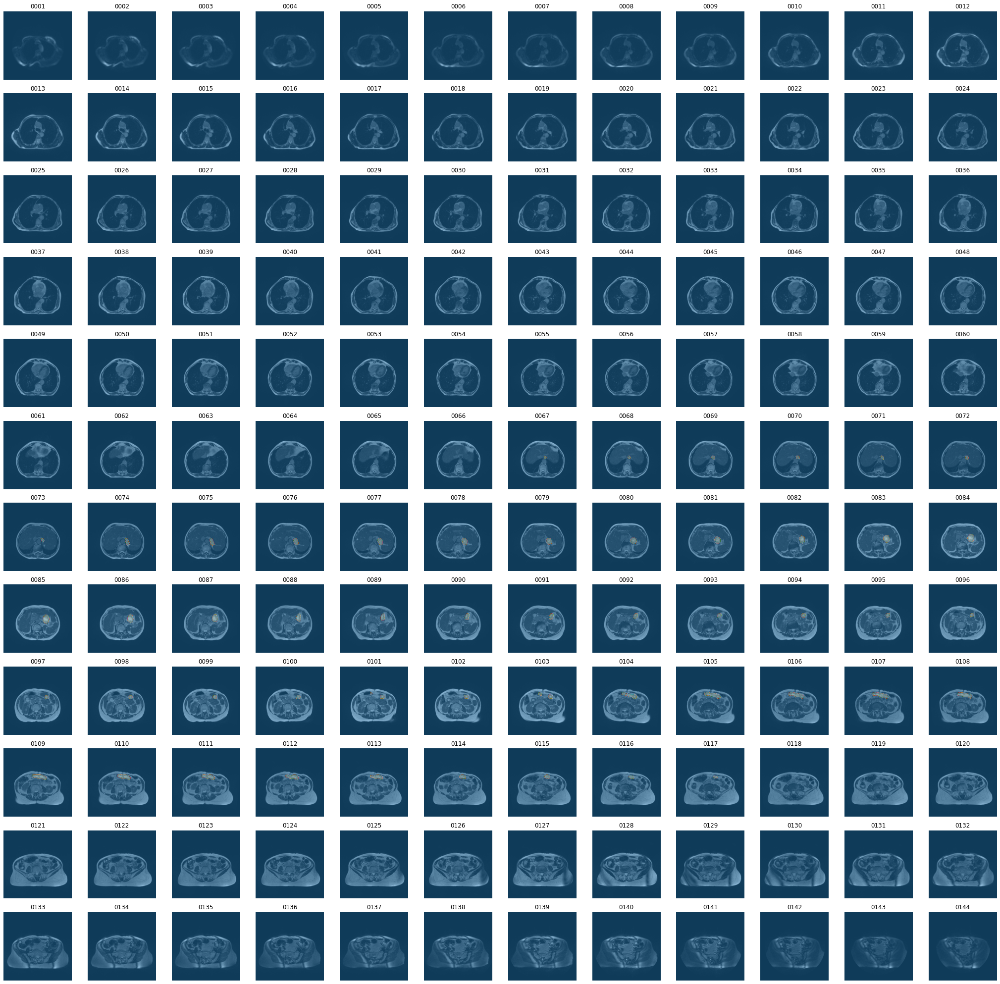

In [57]:
view_case_images_with_masks(139, 14, 12, 12)

In [70]:
train.groupby(['case_id', 'day_num'])['n_segs'].sum().sort_values(ascending=False)

case_id  day_num
130      0          206
138      11         180
143      18         176
2        3          168
131      23         168
                   ... 
78       18          73
         0           70
77       20          69
74       18          58
         13          56
Name: n_segs, Length: 274, dtype: int64

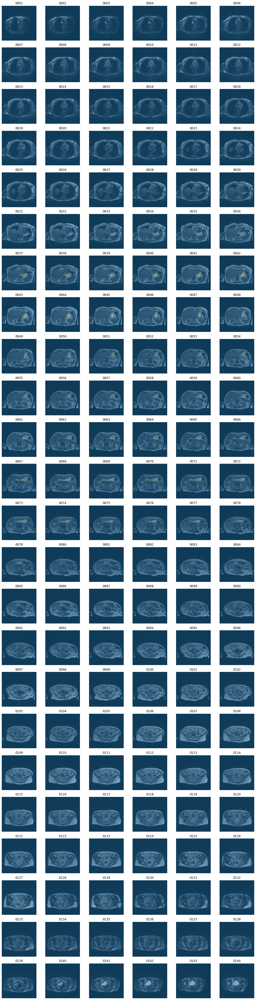

In [71]:
view_case_images_with_masks(130, 0)

In [32]:
tmp = train.query('lb_seg_flag').sample(500).iloc[5]to_records

In [33]:
mask = PILMask.create(rle_decode(tmp['lb_seg_rle'], shape=(tmp['slice_h'], tmp['slice_w']), color=2))

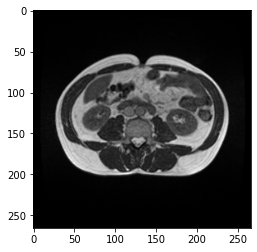

In [34]:
img = Image.open(tmp['fname'])
img = np.interp(img, [np.min(img), np.max(img)], [0,255])
plt.imshow(PILImage.create(img));

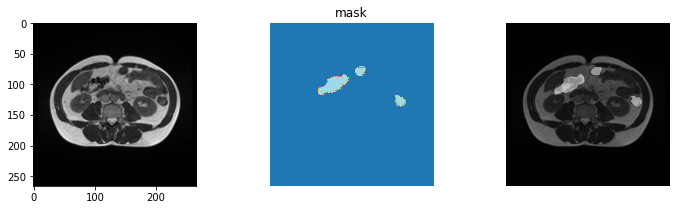

In [35]:
_,axs = plt.subplots(1,3, figsize=(12,3))
axs[0].imshow(img, cmap='gray')
mask.show(alpha=1, ctx=axs[1], title='mask')

axs[2].imshow(img, cmap='gray')
mask.show(ctx=axs[2], cmap='gray');

In [36]:
fn = 'train/case89/case89_day0/scans/slice_0120_360_310_1.50_1.50.png'

In [37]:
train.head(1)

,id,fname,n_segs,lb_seg_rle,lb_seg_flag,sb_seg_rle,sb_seg_flag,st_seg_rle,st_seg_flag,slice_h,slice_w,px_spacing_h,px_spacing_w,case_id_str,case_id,day_num_str,day_num,slice_id
0,case123_day20_slice_0001,train/case123/case123_day20/scans/slice_0001_266_266_1.50_1.50.png,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0001


In [38]:
def get_image(row):
    return row['fname']

def get_mask(row):
    mask = np.zeros((row['slice_h'], row['slice_w']))
    if row['lb_seg_flag']:
        mask += rle_decode(row['lb_seg_rle'], shape=(row['slice_h'], row['slice_w']), color=1)
    if row['sb_seg_flag']:
        mask += rle_decode(row['sb_seg_rle'], shape=(row['slice_h'], row['slice_w']), color=2)
    if row['st_seg_flag']:
        mask += rle_decode(row['st_seg_rle'], shape=(row['slice_h'], row['slice_w']), color=3)
    return mask

In [73]:
db = DataBlock(blocks=(ImageBlock, MaskBlock(codes=array(['#na#', 'lb', 'sb', 'st']))),
                   get_x = get_image,
                   get_y = get_mask,
                   splitter=RandomSplitter(),
                   item_tfms=Resize((120, 160)),
                   batch_tfms=aug_transforms())

In [74]:
# db.summary(train)

In [75]:
dls = db.dataloaders(train)

/opt/conda/lib/python3.8/site-packages/torch/_tensor.py:1131: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  ret = func(*args, **kwargs)


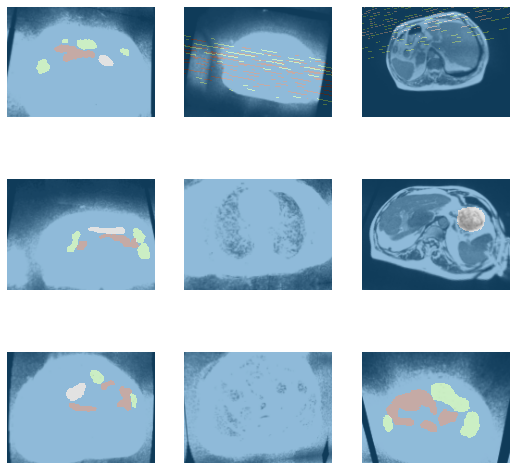

In [76]:
dls.show_batch()

In [46]:
x, y = dls.one_batch()

In [62]:
(y[0] == 3).sum()

TensorMask(353, device='cuda:0')

In [ ]:
learn = unet_learner(dls, resnet34)

In [ ]:
dls.vocab

In [ ]:
learn.fine_tune(6)